# Cats and Dogs image classification

In [1]:
import pathlib
import os
import random
import shutil
import datetime
import time

import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

2024-08-28 15:03:06.512061: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-28 15:03:06.530926: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-28 15:03:06.536355: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-28 15:03:06.549983: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-28 15:03:08.359626: W tensorflow/compiler/tf2

## Preparing the data

### Download and import the data

In [3]:
!kaggle competitions download -c dogs-vs-cats
!unzip dogs-vs-cats.zip
!unzip test1.zip
!unzip train.zip

100%|███████████████████████████████████████▊| 809M/812M [00:24<00:00, 45.8MB/s]
100%|████████████████████████████████████████| 812M/812M [00:24<00:00, 34.8MB/s]
Archive:  dogs-vs-cats.zip
  inflating: sampleSubmission.csv    
  inflating: test1.zip               
  inflating: train.zip               
Archive:  test1.zip
   creating: test1/
  inflating: test1/1.jpg             
  inflating: test1/10.jpg            
  inflating: test1/100.jpg           
  inflating: test1/1000.jpg          
  inflating: test1/10000.jpg         
  inflating: test1/10001.jpg         
  inflating: test1/10002.jpg         
  inflating: test1/10003.jpg         
  inflating: test1/10004.jpg         
  inflating: test1/10005.jpg         
  inflating: test1/10006.jpg         
  inflating: test1/10007.jpg         
  inflating: test1/10008.jpg         
  inflating: test1/10009.jpg         
  inflating: test1/1001.jpg          
  inflating: test1/10010.jpg         
  inflating: test1/10011.jpg         
  inflating

For this dataset, we don't have much to do, except explore the distribution of classes.

We'll only use a small part of the dataset, as it quite huge.

In [2]:
base_dir = pathlib.Path('dogs_vs_cats_small')
target_size = (180, 180)

In [3]:
all_dir = pathlib.Path('train')

def make_subset(typ, start_index, end_index):
    for category in ['dog', 'cat']:
        dest = base_dir / typ / category
        os.makedirs(dest, exist_ok=True)
        for i in range(start_index, end_index):
            fname = f'{category}.{i}.jpg'
            shutil.copy(all_dir / fname, dest)

make_subset('train', start_index=0, end_index=1000)
make_subset('val', start_index=1000, end_index=1500)
make_subset('test', start_index=1500, end_index=2500)

# TODO: show some of the images

### Prepare the data for our model

All the images should be the same size, in RGB format, so tensors of shape (128, 128, 3).

We also rescale our images so the colors are in range [0,1] instead of [0,255].

In [4]:
rescaling = tf.keras.layers.Rescaling(1./255)

def load_and_scale(typ):
    dataset = tf.keras.utils.image_dataset_from_directory(
        base_dir / typ,
        image_size=(180, 180),
        label_mode='binary',
        batch_size=32,
    )
    return dataset.map(lambda x, y: (rescaling(x), y))


train_data = load_and_scale('train')
val_data = load_and_scale('val')
test_data = load_and_scale('test')

Found 2000 files belonging to 2 classes.


I0000 00:00:1724850194.660140   23180 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1724850194.723769   23180 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1724850194.724017   23180 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1724850194.724794   23180 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

Found 1000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


## Creating and training models

Common pattern: increase the number of patterns along layers, but decrease window sizes. The goal is to obtain small filter sizes just before flattening, here 7x7.

We use the sigmoid activation function for this binary classification problem.

False positives and false negatives have the same impact here, so we set the classification threshold as 0.5.

### Skeleton

In [5]:
def create_and_process_model(name,
                             build_function=None,
                             threshold=0.5,
                             learning_rate=0.001,
                             epochs=30,
                             model=None,
                             training_features=None,
                             training_labels=None,
                             training_dataset=None,
                             validation_dataset=None,
                             loss=tf.keras.losses.BinaryCrossentropy(),
                             metrics=None
                             ):
    date = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

    if model is None:
        model = build_function()

    if metrics is None:
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name='accuracy', threshold=threshold),
            tf.keras.metrics.Precision(name='precision', thresholds=threshold),
            tf.keras.metrics.Recall(name='recall', thresholds=threshold)
        ]

    model.compile(
        optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
        loss=loss,
        metrics=metrics
    )
    print(model.summary())

    kwargs = {
        'epochs': epochs,
        'validation_data': validation_dataset,
        'callbacks': [
            tf.keras.callbacks.ModelCheckpoint(f'models/{name}.keras', save_best_only=True, monitor='val_loss'),
            tf.keras.callbacks.BackupAndRestore(backup_dir=f'/tmp/backup/{name}--{date}'),
            tf.keras.callbacks.TensorBoard(log_dir=f'logs/fit/{name}--{date}', histogram_freq=1)
        ]
    }

    if training_features is not None and training_labels is not None:
        model.fit(
            training_features,
            training_labels,
            **kwargs
        )
    else:
        model.fit(
            training_dataset,
            **kwargs
        )

In [6]:
def test_best_model(name, test_dataset=test_data):
    best_model = tf.keras.models.load_model(f'models/{name}.keras')
    metrics = best_model.evaluate(test_dataset)
    print(f'Metrics for {name}:')
    print(f'- Accuracy: {metrics[1]:.2f}')
    print(f'- Precision: {metrics[2]:.2f}')
    print(f'- Recall: {metrics[3]:.2f}')

In [7]:
def plot_model(model, name='model'):
    tf.keras.utils.plot_model(
      model,
      to_file=f"models/{name}.png",
      show_shapes=True,
      show_dtype=True,
      show_layer_names=True,
      show_layer_activations=True)

### Classic CNN

In [ ]:
def create_cnn():
    shape = [32, 64, 128, 256, 256]

    inputs = tf.keras.Input(shape=(180, 180, 3))
    x = inputs

    for i, filters in enumerate(shape):
        x = tf.keras.layers.Conv2D(filters=filters, kernel_size=3, activation='relu')(x)
        if i < len(shape) - 1:
            x = tf.keras.layers.MaxPool2D(pool_size=2)(x)

    x = tf.keras.layers.Flatten()(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    return tf.keras.Model(inputs, outputs)


create_and_process_model('cnn', build_function=create_cnn, training_dataset=train_data, validation_dataset=val_data)

We observe a strong overfitting, with a training accuracy reaching 100% whereas the validation accuracy plateaues at 71%. Precision and recall are close to each other.

In [ ]:
test_best_model('cnn')

This accuracy will serve to further improve this model, by adding regualization and other techniques.

### Getting rid of overtiffing

We'll use Data augmentation, relevant for computer vision problems, and Dropout.

In [8]:
AUTOTUNE = tf.data.AUTOTUNE

augmentation_pipeline = tf.keras.Sequential([
    tf.keras.layers.RandomFlip(),
    tf.keras.layers.RandomRotation(factor=0.2),
    tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2),
])

train_data_augmented = train_data.map(lambda x, y: (augmentation_pipeline(x, training=True), y), num_parallel_calls=AUTOTUNE)

In [ ]:
def create_cnn_reg():
    shape = [32, 64, 128, 256, 256]

    inputs = tf.keras.Input(shape=(180, 180, 3))
    x = inputs

    for i, filters in enumerate(shape):
        x = tf.keras.layers.Conv2D(filters=filters, kernel_size=3, activation='relu')(x)
        if i < len(shape) - 1:
            x = tf.keras.layers.MaxPool2D(pool_size=2)(x)

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    return tf.keras.Model(inputs, outputs)


create_and_process_model('cnn_reg', build_function=create_cnn_reg, training_dataset=train_data_augmented, validation_dataset=val_data, epochs=100)

In [ ]:
test_best_model('cnn_reg')

## Using pre-trained models

We don't include higher layers, as we want to train the model on our dataset.

In [ ]:
xception = tf.keras.applications.Xception(include_top=False, input_shape=(180, 180, 3))
xception.summary()

### Standalone transfer learning

We use the predictions of the model as new features.

Here, we cannot use data augmentation.

This model, as many of them included in the `keras.applications` module, require to preprocess the input before passing the features.

In [ ]:
def get_features_and_labels(dataset):
    all_features = []
    all_labels = []
    # Going over all the batches
    for images, labels in dataset:
        preprocessed_images = tf.keras.applications.xception.preprocess_input(images)
        features = xception.predict(preprocessed_images)
        # Append arrays of features and labels in an array
        all_features.append(features)
        all_labels.append(labels)

    return np.concatenate(all_features), np.concatenate(all_labels)

train_features, train_labels = get_features_and_labels(train_data)
val_features, val_labels = get_features_and_labels(val_data)
test_features, test_labels = get_features_and_labels(test_data)

Let's look at the shape of the feature map, which will determine the input of our dense network. The first number will correspond to the number of samples in our dataset.

We will have to flatten these features for our dense network.

In [ ]:
train_features.shape

In [ ]:
def create_dense():
    inputs = tf.keras.Input(shape=(6, 6, 2048))
    x = tf.keras.layers.Flatten()(inputs)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Don't forget the activation function, according to our problem!

    return tf.keras.Model(inputs, outputs)

create_and_process_model(
    'xception_dense',
    build_function=create_dense,
    training_features=train_features,
    training_labels=train_labels,
    validation_dataset=(val_features, val_labels)
)

In [ ]:
test_best_model('xception_dense', test_dataset=(test_features, test_labels))

### End-to-end transfer learning

We still have to pre-process the inputs before feeding the model with our features.

In [ ]:
def create_dense_upgrade():
    xception.trainable = False
    inputs = tf.keras.Input(shape=(180, 180, 3))
    x = tf.keras.applications.xception.preprocess_input(inputs)  # Xception instance was initialized with the correct input shape
    x = xception(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Don't forget the activation function, according to our problem!

    return tf.keras.Model(inputs, outputs)


create_and_process_model(
    'xception_dense_upgrade',
    build_function=create_dense_upgrade,
    training_dataset=train_data_augmented,
    validation_dataset=val_data,
    epochs=100,
    learning_rate=1e-4
)

In [ ]:
test_best_model('xception_dense_upgrade')

### Fine-tuning this model

Now that the dense part has been trained, we can fine-tune the entire model, by unlocking the last layers.

In [ ]:
xception.trainable = True
for layer in xception.layers[:-4]:
    layer.trainable = False

create_and_process_model(
    'xception_fine-tuned',
    model=tf.keras.models.load_model(f'models/xception_dense_upgrade.keras'),
    training_dataset=train_data_augmented,
    validation_dataset=val_data,
    learning_rate=1e-5
)

## Creating a full Xception-like model

We add several new features :

- Batch normalization,
- Depthwise separable convolutions,
- Residual connections

Reminder: data augmentation and rescaling are located in the tf.data pipeline.

In [17]:
def create_xception_like():
    inputs = tf.keras.Input(shape=(180, 180, 3))
    x = tf.keras.layers.Conv2D(filters=32, kernel_size=5, use_bias=False)(inputs)

    # Each 'size' will comprise two SepConv layers    
    sizes = [32, 64, 128, 256, 512]

    for i, filters in enumerate(sizes):
        connection = x

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
        x = tf.keras.layers.SeparableConv2D(filters=filters, kernel_size=3, padding='same', use_bias=False)(x)

        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
        x = tf.keras.layers.SeparableConv2D(filters=filters, kernel_size=3, padding='same', use_bias=False)(x)

        # Pooling should always be right after convolution layers
        # We use a larger pool size, but we only want to downscale our filters by a factor of 2, which is tunable with the stride
        x = tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')(x)

        # The previous block had fewer filters, so we must apply a convolution here
        # We also include a stride to take into account the max pooling done in the layer
        # Don't include the bias that would be destroyed by the next batch normalization
        connection = tf.keras.layers.Conv2D(filters=filters, kernel_size=1, strides=2, padding='same', use_bias=False)(connection)

        # The residual connection is summed with the output of the layer!
        x = tf.keras.layers.Add()([x, connection])

    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    # x = tf.keras.layers.Dense(32, activation='relu')(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    return tf.keras.Model(inputs, outputs)

create_and_process_model(
    'xception_like',
    build_function=create_xception_like,
    training_dataset=train_data_augmented,
    validation_dataset=val_data,
    epochs=30
)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 180, 180,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 176, 176,  │      2,400 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 176, 176,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 176, 176,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_4  │ (None, 176, 176,  │      1,312 │ activation_4[0][… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 176, 176,  │        128 │ separable_conv2d… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 176, 176,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_5  │ (None, 176, 176,  │      1,312 │ activation_5[0][… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 88, 88,    │          0 │ separable_conv2d… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 88, 88,    │      1,024 │ conv2d_4[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 88, 88,    │          0 │ max_pooling2d_2[… │
│                     │ 32)               │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 88, 88,    │        128 │ add[0][0]         │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_6        │ (None, 88, 88,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_6  │ (None, 88, 88,    │      2,336 │ activation_6[0][… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 88, 88,    │        256 │ separable_conv2d… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_7        │ (None, 88, 88,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_7  │ (None, 88, 88,    │      4,672 │ activation_7[0][

 Total params: 721,857 (2.75 MB)

 Trainable params: 718,849 (2.74 MB)

 Non-trainable params: 3,008 (11.75 KB)

None
Epoch 1/30


I0000 00:00:1723788981.935092   15098 service.cc:146] XLA service 0x7fc858008570 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1723788981.935121   15098 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce GTX 1050, Compute Capability 6.1
2024-08-16 08:16:22.146450: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-08-16 08:16:22.949091: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-08-16 08:16:29.021233: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng12{k5=1,k6=0,k7=1,k10=7} for conv (f32[32,32,176,176]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,176,176]{3,2,1,0}, f32[32,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=32, custom_call_target="__cudnn$convForward", backend_config={"operati

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - accuracy: 0.5625 - loss: 0.7901 - precision: 0.5631 - recall: 0.5700

2024-08-16 08:17:32.144955: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_3', 8 bytes spill stores, 8 bytes spill loads



63/63 ━━━━━━━━━━━━━━━━━━━━ 89s 785ms/step - accuracy: 0.5627 - loss: 0.7888 - precision: 0.5633 - recall: 0.5698 - val_accuracy: 0.5000 - val_loss: 0.6930 - val_precision: 0.5000 - val_recall: 0.9880
Epoch 2/30


2024-08-16 08:17:43.809147: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 31457280 exceeds 10% of free system memory.
2024-08-16 08:17:43.863765: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 62914560 exceeds 10% of free system memory.
2024-08-16 08:17:43.902656: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 31457280 exceeds 10% of free system memory.


63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 314ms/step - accuracy: 0.5686 - loss: 0.6772 - precision: 0.5688 - recall: 0.5439 - val_accuracy: 0.5000 - val_loss: 0.6941 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/30


2024-08-16 08:18:03.956451: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 31457280 exceeds 10% of free system memory.
2024-08-16 08:18:04.021833: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 62914560 exceeds 10% of free system memory.


63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 327ms/step - accuracy: 0.6075 - loss: 0.6764 - precision: 0.6224 - recall: 0.5488 - val_accuracy: 0.5000 - val_loss: 0.6935 - val_precision: 0.5000 - val_recall: 0.9960
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 321ms/step - accuracy: 0.6532 - loss: 0.6440 - precision: 0.6716 - recall: 0.5975 - val_accuracy: 0.5000 - val_loss: 0.6964 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 22s 346ms/step - accuracy: 0.6409 - loss: 0.6431 - precision: 0.6632 - recall: 0.5734 - val_accuracy: 0.5000 - val_loss: 0.7022 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 23s 350ms/step - accuracy: 0.6773 - loss: 0.6211 - precision: 0.6935 - recall: 0.6011 - val_accuracy: 0.5000 - val_loss: 0.7499 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 23s 344ms/step - accuracy: 0.6598 - loss: 0.6237 - precision: 0.6717 - recall: 0.6009 - val_accuracy: 0.5

In [18]:
create_and_process_model(
    'xception_like',
    model=tf.keras.models.load_model('models/xception_like.keras'),
    training_dataset=train_data_augmented,
    validation_dataset=val_data,
    epochs=70
)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 180, 180,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 176, 176,  │      2,400 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 176, 176,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 176, 176,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_4  │ (None, 176, 176,  │      1,312 │ activation_4[0][… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 176, 176,  │        128 │ separable_conv2d… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 176, 176,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_5  │ (None, 176, 176,  │      1,312 │ activation_5[0][… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 88, 88,    │          0 │ separable_conv2d… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 88, 88,    │      1,024 │ conv2d_4[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 88, 88,    │          0 │ max_pooling2d_2[… │
│                     │ 32)               │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 88, 88,    │        128 │ add[0][0]         │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_6        │ (None, 88, 88,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_6  │ (None, 88, 88,    │      2,336 │ activation_6[0][… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 88, 88,    │        256 │ separable_conv2d… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_7        │ (None, 88, 88,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_7  │ (None, 88, 88,    │      4,672 │ activation_7[0][

 Total params: 721,857 (2.75 MB)

 Trainable params: 718,849 (2.74 MB)

 Non-trainable params: 3,008 (11.75 KB)

None
Epoch 1/70
63/63 ━━━━━━━━━━━━━━━━━━━━ 36s 403ms/step - accuracy: 0.7484 - loss: 0.5025 - precision: 0.7597 - recall: 0.7106 - val_accuracy: 0.5520 - val_loss: 1.3118 - val_precision: 0.5277 - val_recall: 0.9900
Epoch 2/70
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 307ms/step - accuracy: 0.7820 - loss: 0.4607 - precision: 0.7973 - recall: 0.7506 - val_accuracy: 0.6860 - val_loss: 0.7614 - val_precision: 0.6352 - val_recall: 0.8740
Epoch 3/70
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 308ms/step - accuracy: 0.7764 - loss: 0.4704 - precision: 0.7875 - recall: 0.7493 - val_accuracy: 0.7080 - val_loss: 0.6279 - val_precision: 0.8114 - val_recall: 0.5420
Epoch 4/70
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 313ms/step - accuracy: 0.8005 - loss: 0.4623 - precision: 0.7984 - recall: 0.7931 - val_accuracy: 0.7360 - val_loss: 0.5271 - val_precision: 0.7770 - val_recall: 0.6620
Epoch 5/70
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 314ms/step - accuracy: 0.7936 - loss: 0.4387 - precision: 0.8095 - recall: 0.7632 - val_accuracy: 0.5630 - va

## Visualizing the CNN

In [9]:
xception_like = tf.keras.models.load_model('models/xception_like.keras')
print(xception_like.summary())
tf.keras.utils.plot_model(xception_like,
                          to_file='models/xception_like.png',
                          show_shapes=True,
                          show_dtype=True,
                          show_layer_names=True,
                          show_layer_activations=True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 180, 180,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 176, 176,  │      2,400 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 176, 176,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 176, 176,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_4  │ (None, 176, 176,  │      1,312 │ activation_4[0][… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 176, 176,  │        128 │ separable_conv2d… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 176, 176,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_5  │ (None, 176, 176,  │      1,312 │ activation_5[0][… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 88, 88,    │          0 │ separable_conv2d… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 88, 88,    │      1,024 │ conv2d_4[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 88, 88,    │          0 │ max_pooling2d_2[… │
│                     │ 32)               │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 88, 88,    │        128 │ add[0][0]         │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_6        │ (None, 88, 88,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_6  │ (None, 88, 88,    │      2,336 │ activation_6[0][… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 88, 88,    │        256 │ separable_conv2d… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_7        │ (None, 88, 88,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_7  │ (None, 88, 88,    │      4,672 │ activation_7[0][

 Total params: 1,440,708 (5.50 MB)

 Trainable params: 718,849 (2.74 MB)

 Non-trainable params: 3,008 (11.75 KB)

 Optimizer params: 718,851 (2.74 MB)

None


We're going to use a test image to print all the relevant information

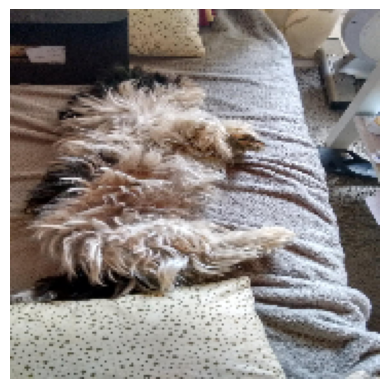

In [112]:
test_name = "dog2"
test_img = tf.keras.utils.load_img(f"test/{test_name}.jpg", target_size=target_size)
plt.axis(False)
plt.imshow(test_img)

In [113]:
test_data = np.array([
    rescaling(tf.keras.utils.img_to_array(test_img))
])
test_data

array([[[[0.23137257, 0.20784315, 0.20784315],
         [0.21960786, 0.19607845, 0.19607845],
         [0.20000002, 0.18039216, 0.16862746],
         ...,
         [0.5058824 , 0.50980395, 0.5294118 ],
         [0.5137255 , 0.50980395, 0.5411765 ],
         [0.50980395, 0.49803925, 0.53333336]],

        [[0.21176472, 0.19215688, 0.21568629],
         [0.22352943, 0.20392159, 0.227451  ],
         [0.1764706 , 0.15686275, 0.17254902],
         ...,
         [0.50980395, 0.5058824 , 0.5372549 ],
         [0.5137255 , 0.5137255 , 0.52156866],
         [0.5647059 , 0.5647059 , 0.57254905]],

        [[0.17254902, 0.15294118, 0.1764706 ],
         [0.18039216, 0.16078432, 0.18431373],
         [0.227451  , 0.20784315, 0.22352943],
         ...,
         [0.5372549 , 0.53333336, 0.5647059 ],
         [0.5686275 , 0.5686275 , 0.5764706 ],
         [0.5647059 , 0.5647059 , 0.57254905]],

        ...,

        [[0.6431373 , 0.64705884, 0.5921569 ],
         [0.6431373 , 0.64705884, 0.5921569 ]

### Intermediate activations

We create a model with multiple outputs, corresponding to those of convolution and max pooling layers. We want to execute the model and only get the outputs of those layers, so we do not create a new functional model, but we rather clarify some exits.

We don't include simple Conv layers, as they are for residual connections, thus not carrying useful information.

In [114]:
activation_input = tf.keras.Input(shape=target_size + (3,))

all_activations = []
all_names = []  # We'll store the name of layers' outputs for display purposes
for layer in xception_like.layers:
    if isinstance(layer, (tf.keras.layers.SeparableConv2D, tf.keras.layers.MaxPool2D)):
        all_activations.append(layer.output)
        all_names.append(layer.name)

activation_model = tf.keras.Model(xception_like.input, all_activations)
# print(activation_model.summary())
# plot_model(activation_model, name='activation_model')

In [115]:
activations = activation_model.predict(test_data)
xception_like.predict(test_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


array([[0.6225968]], dtype=float32)

We can inspect the shape of our output, for example by taking the 6th layer considered by our method:

In [116]:
all_names[5], activations[5].shape

('max_pooling2d_3', (1, 44, 44, 64))

There's only one image, of which 64 filters have been extracted.

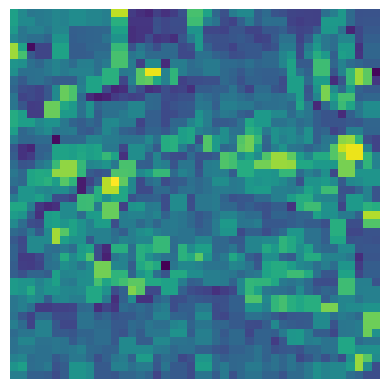

In [117]:
plt.axis(False)
plt.imshow(activations[5][0,:,:,31])

Let's plot every image, by normalizing its values between 0 and 255. Assuming every channel has a normal distribution of values:

- Subtract mean and divide by standard deviation ;
- Multiply by a new std, and add a new mean
- Cut values that do not fit in [0, 255]

We do this for every non-zero channel.

In [120]:
plt.figure.max_open_warning = 30

for i, layer in enumerate(activations):
    layer_name = all_names[i]
    nb_filters = layer.shape[-1]  # General use, when we don't know the rest of the shape (with or without batches, etc...)
    nb_rows = nb_filters // 16
    nb_cols = 16
    fig, axs = plt.subplots(nrows=nb_rows, ncols=nb_cols, figsize=(8 * nb_cols, 6 * nb_rows))
    fig.suptitle(layer_name)
    
    for f in range(nb_filters):
        plt.sca(axs[f // 16, f % 16])
        plt.axis(False)
        channel_image = layer[0, :, :, f].copy()
        if channel_image.sum() != 0:
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
        
        # Remove every value that does not fit in the interval
        channel_image = np.clip(channel_image, 0, 255).astype(np.uint8)
        plt.imshow(layer[0, :, :, f], cmap="viridis")
    fig.tight_layout()
    plt.savefig(f"./outputs/activations_{test_name}/{layer_name}.png")
    plt.close()

### Filters

For each separable convolution layer, we compute the activation and try to maximise the mean of its filters by applying a gradient descent.

We don't consider the borders of the image to calculate loss, to avoid artifacts.

In [23]:
conv_layer_names = []

for layer in xception_like.layers:
    if isinstance(layer, tf.keras.layers.SeparableConv2D):
        conv_layer_names.append(layer.name)
        
conv_layer_names

['separable_conv2d_4',
 'separable_conv2d_5',
 'separable_conv2d_6',
 'separable_conv2d_7',
 'separable_conv2d_8',
 'separable_conv2d_9',
 'separable_conv2d_10',
 'separable_conv2d_11',
 'separable_conv2d_12',
 'separable_conv2d_13']

In [97]:
def compute_filter_loss(model, filter_index, image):
    activation = model(image)
    return tf.reduce_mean(activation[:, 2:-2, 2:-2, filter_index])


def gradient_step(model, filter_index, image, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)  # "image" is a tensor, so it must be watched manually
        loss = compute_filter_loss(model, filter_index, image)
    gradient = tape.gradient(loss, image)
    # Trick to smooth the training
    gradient = tf.math.l2_normalize(gradient)
    image += learning_rate * gradient
    return image
    

def generate_pattern(model, filter_index, epochs, learning_rate):
    image = tf.random.uniform(shape=(1,) + target_size + (3,), minval=0.4, maxval=0.7)
    for i in range(epochs):
        image = gradient_step(model, filter_index, image, learning_rate)
    
    return image[0].numpy()


def standardize_image(image):
    image -= np.mean(image)
    image /= np.std(image)
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype(np.uint8)
    return image[25:-25, 25:-25, :]

separable_conv2d_4
separable_conv2d_5
separable_conv2d_6
separable_conv2d_7
separable_conv2d_8
separable_conv2d_9
separable_conv2d_10
separable_conv2d_11
separable_conv2d_12
separable_conv2d_13


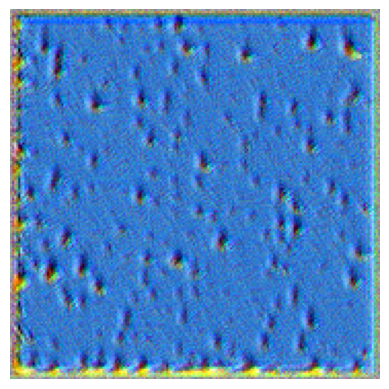

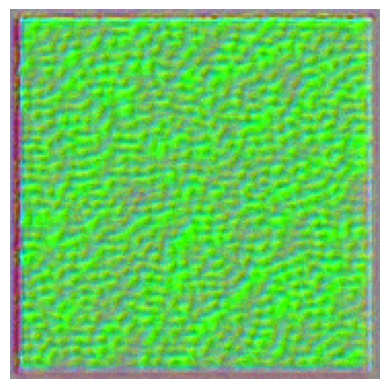

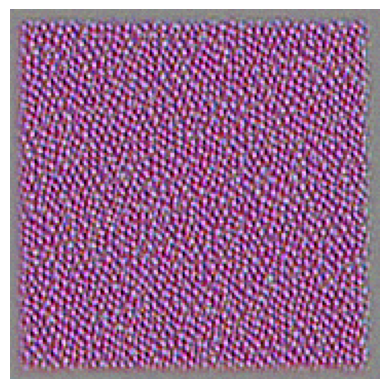

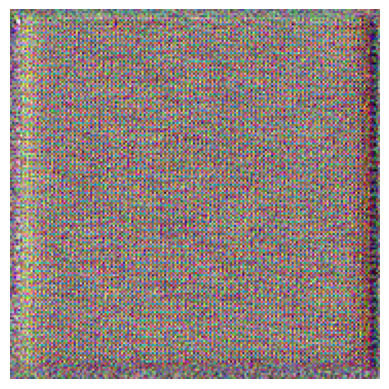

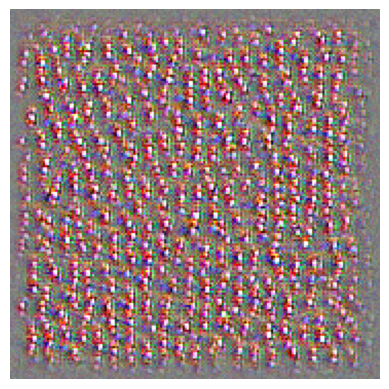

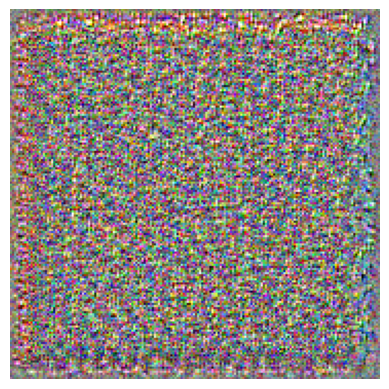

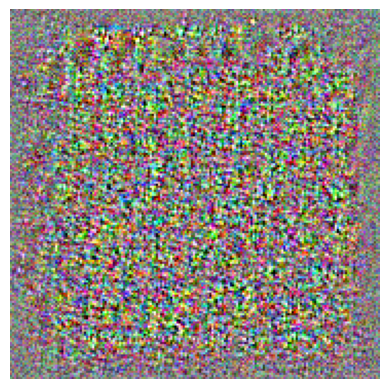

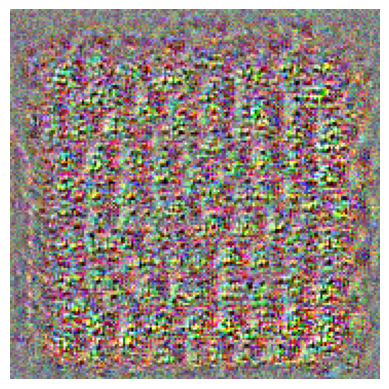

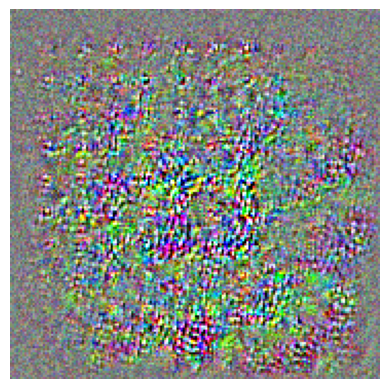

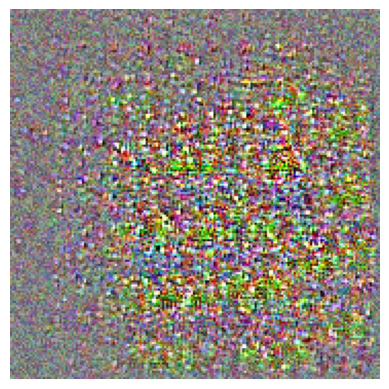

In [101]:
for name in conv_layer_names:
    layer = xception_like.get_layer(name=name)
    filter_model = tf.keras.Model(inputs=xception_like.input, outputs=layer.output)

    image = generate_pattern(
        model=filter_model,
        filter_index=9,
        epochs=30,
        learning_rate=10
    )
    
    print(name)
    plt.figure()
    plt.axis(False)
    plt.imshow(standardize_image(image))
    
plt.show()

### Classification heatmap

# Image segmentation

## Data engineering

### Downloading and extracting assets

In [ ]:
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
!tar -xf images.tar.gz
!tar -xf annotations.tar.gz

### Loading the images and annotations

We should pay attention to the files starting with a dot, as it's not proper images.

In [6]:
images_dir = 'images'
annotations_dir = 'annotations/trimaps'

def get_file_names(directory, extension):
    # We sort everything, so we are sure that an index corresponds to the right image-annotation couple, as their filename are similar
    return sorted([os.path.join(directory, filename) for filename in os.listdir(directory) if filename.endswith(extension) and not filename.startswith('.')])


image_paths = get_file_names(images_dir, '.jpg')
annotation_paths = get_file_names(annotations_dir, '.png')

nb_samples = len(image_paths)

### Analyzing the dataset

In [ ]:
import re
group_re = re.compile(r"images\/(.*)_[0-9]+\.jpg")

groups = {}
nb_dogs = 0
nb_cats = 0

for path in image_paths:
    name = group_re.match(path).group(1)
    if name in groups.keys():
        groups[name] += 1
    else:
        groups[name] = 1

    if name[0].isupper():
        nb_cats += 1
    else:
        nb_dogs += 1


print(f'Total dogs number: {nb_dogs}')
print(f'Total cats number: {nb_cats}')
print('-----------------------------')
for name, count in groups.items():
    print(f'{name}: {count}')

Every race is balanced, except "staffordshire_bull_terrier" and "scottish_terrier" with a small offset.

There is still an imbalance between cats and dogs, with a factor of nearly 2 between the two numbers.

In [ ]:
widths = []
heights = []

for path in image_paths:
    ar = tf.keras.utils.img_to_array(tf.keras.utils.load_img(path))
    widths.append(ar.shape[0])
    heights.append(ar.shape[1])


pd.DataFrame({
    'width': widths,
    'height': heights
})

Let's visualize a image-annotation couple.

- We know that the annotations are stored in a file that's the same size as the image, so we load it as an image with only one color channel
- Values range from 1 to 3 ; we make them range from 0 to 2 and scale them to have 0-255 grayscale values.

In [ ]:
plt.axis(False)
plt.imshow(tf.keras.utils.load_img(image_paths[9]))

In [ ]:
annotation = tf.keras.utils.img_to_array(
    tf.keras.utils.load_img(annotation_paths[9], color_mode="grayscale")  # Grayscale needed to interpret the file as a 1-channel image
)
plt.imshow((annotation.astype('uint8') - 1) * 127)

## Data pipeline

We'll prefer shuffling image paths rather than the images themselves, which will be more efficient.

We scale our images to all be 200x200. We have to subtract one to all the annotations, to have them in range 0-2.

In [8]:
img_size = (200, 200)

# Use the same seed for both shuffling to keep the couples in place
timestamp = int(time.time())
random.Random(timestamp).shuffle(image_paths)
random.Random(timestamp).shuffle(annotation_paths)

all_images = np.zeros(shape=(nb_samples,) + img_size + (3,), dtype=np.float32) # Syntax to concatenate tuples ; let images as float for further rescaling
all_annotations = np.zeros(shape=(nb_samples,) + img_size + (1,), dtype=np.uint8)


# Be careful to make the two processes separate, as one is grayscale and rescaled
def path_to_image(path):
    return tf.keras.utils.img_to_array(tf.keras.utils.load_img(path, target_size=img_size))


def path_to_annotation(path):
    img = tf.keras.utils.img_to_array(tf.keras.utils.load_img(path, color_mode='grayscale', target_size=img_size))
    return img.astype(np.uint8) - 1


for i in range(nb_samples):
    all_images[i] = path_to_image(image_paths[i])
    all_annotations[i] = path_to_annotation(annotation_paths[i])

Here, our dataset is too small to have a test set. We'll check those manually later

In [9]:
validation_split = 0.2

validation_index = int(nb_samples * validation_split)

train_images = all_images[:validation_index]
train_annotations = all_annotations[:validation_index]
validation_images = all_images[validation_index:]
validation_annotations = all_annotations[validation_index:]

We don't forget to normalize the color values between 0 and 1

In [10]:
batch_size = 64

def create_dataset(images, annotations):
    scaling = tf.keras.layers.Rescaling(1. / 255.)
    return tf.data.Dataset.from_tensor_slices((images, annotations)).batch(batch_size).map(lambda x, y: (scaling(x), y))

train_dataset = create_dataset(train_images, train_annotations)
validation_dataset = create_dataset(validation_images, validation_annotations)

I0000 00:00:1723568983.791809   35296 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1723568983.832296   35296 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1723568983.832541   35296 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1723568983.835202   35296 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

## Creating the model

Parts of the model is different from what we developed for the image classification earlier:

- We want the same output size as the input, so we have to apply transposed convolutions after convolutions ;
- At the end, we want 3 filters: one for each category (foreground, border, background), so we apply a last convolution to each pixel ;
- We face a multicategories classification problem, so we must apply softmax at the end of our model.

In [ ]:
def create_segmentation_model():
    inputs = tf.keras.Input(shape=img_size + (3,))
    x = inputs

    shape = [64, 64, 128, 128, 256, 256]
    for i, units in enumerate(shape):
        # Padding must be set to "same" in order not to lose information that would be unrecoverable in transposition layers
        x = tf.keras.layers.Conv2D(filters=units, kernel_size=3, strides=2 - (i % 2), padding='same', activation='relu')(x)

    for i, units in enumerate(reversed(shape)):
        x = tf.keras.layers.Conv2DTranspose(filters=units, kernel_size=3, strides=2 - (i % 2), padding='same', activation='relu')(x)

    outputs = tf.keras.layers.Conv2D(filters=3, kernel_size=3, padding='same', activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)


create_and_process_model(
    'segmentation',
    epochs=60,
    build_function=create_segmentation_model,
    training_features=train_images,
    training_labels=train_annotations,
    validation_dataset=(validation_images, validation_annotations),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),  # Adapt the loss to our problem: multiple label classes that are label-encoded (not one-hot encoded, in this case we could have used categorical crossentropy
    metrics=[]
)